<div class="usecase-title">Ideal Green Wall Locations</div>

<div class="usecase-authors"><b>Authored by: </b>Alison Collins</div>

<div class="usecase-duration"><b>Duration:</b> 90 mins</div>

<div class="usecase-level-skill">
    <div class="usecase-level"><b>Level: </b>Intermediate</div>
    <div class="usecase-skill"><b>Pre-requisite Skills: </b>Python, Data Preprocessing, Data Analysis, Geospatial Clustering</div>
</div>

<div class="usecase-section-header">Scenario</div>

1. As an ecologist, I want to increase the biodiversity of flora and fauna life within the city of Melbourne.

2. As a city planner, I need to know the best locations for green walls within the city of Melbourne, where they will have the greatest impact on reducing pollution and increasing fauna numbers.

3. As a resident, I wish to have more green places to aid in my feelings of welbeing within the city.

<div class="usecase-section-header">Background</div>

There is much current emphasis on the increase of green spaces within our cities worldwide. Much research has been done into the benefits of increasing plant life in cities, with findings showing green spaces <a href="#fn-1">[1]</a>: 
- allow greater oxygen production for fresh air to breathe
- provide increased storage ability to absorb carbon dioxide and particle pollutatnts, helping clean air
- swell evapotranspiration, which produces a cooling effect that assists in reducing heat waves
- provide habitats for wildlife
- reduce cortisol, improving mental health and wellbeing of city dwellers

Green walls provide a solution to the lack of space in cities for additional green spaces. Green walls are also called vertical gardens and are made up of plants growing directly up a wall or in a supporting structure attached to a wall. In addition to the known benefits of increasing plant numbers, green walls have also been found to assist with temperature control and reduce noise pollution within the buildings they are attached to <a href="#fn-2">[2]</a>.

The planting of green walls aligns with the City of Melbourne’s Nature in the City Strategy and Urban Forest Strategy <a href="#fn-3">[3]</a>. Programs such as the Greening the City Project and Green Yout Laneway program can both be supported by identifying the optimal locations for green walls.

<div class="usecase-section-header">Use Case Purpose</div>

As green walls have been proven to increase microfauna and decrease pollutants, this use case will first investigate the need for green walls through analysis of pollutant levels and microfauna. As green walls have be shown to increase wellbeing, green walls should be placed in locations to have maximum impact on population numbers, thus this use case will then find the optimal locations for green walls based on locations of high foot-traffic and absence of microfauna.

<div class="usecase-section-header">What this use case will teach you</div>

At the end of this use case you will:
- Import data using API v2.1 GET request with /exports extension
- Dataframe manipulations including group by and merging frames
- Data visualisation by using dataframes, matplotlib, seaborn
- Convert between dataframes and Geodataframes
- Mapping with folium incuding custom markers
- K-means cluster modelling with Geodata

# REQUIRED MODULES

In [3]:
# Import dependencies
import warnings
warnings.filterwarnings("ignore")

import requests
import pandas as pd
pd.set_option('display.max_columns', None)
from io import StringIO

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
from wordcloud import WordCloud
import geopandas as gpd
from shapely.geometry import Polygon, MultiPolygon

from sklearn import preprocessing, cluster
import scipy


# DATASET IMPORT AND ANAYSIS

<div class="usecase-section-header">Relevant Datasets</div>

[Microclimate Sensor Readings](https://data.melbourne.vic.gov.au/explore/dataset/microclimate-sensor-readings/information/)

- This dataset conatins microcliamte data from across the City of Melbourne. This includes air temperature, relative humidity, barometric pressure, particulate matter (2.5 and 10) and average wind speed. The site_id column can be used to merge this data with the Sensor Location dataset. This dataset is imported from Melbourne Open Data website, using a GET request with /export/ extension, from API V2.1.

[Microclimate Sensor Locations](https://data.melbourne.vic.gov.au/explore/dataset/microclimate-sensor-locations/information/)
- This dataset conatins the location geographical co-ordinates and description for each microsensor across the city of Melbourne. The site_id column can be used to merge this data with the Microclimate Sensor Readings dataset. A GET request with /export/ extension, from API V2.1 is also used to collect this data from Melbourne Open Data website.

[Butterfly Biodiversity Survey 2017](https://data.melbourne.vic.gov.au/explore/dataset/butterfly-biodiversity-survey-2017/information/)
- A dataset collated from indivual sightings of butterflies within the City of Melbourne. This study was designed as an addition to the Little Things Insect survey which did not include butterflies. The data includes location (geogphical co-ordinates and description), date, abiotic measurements (wind speed, temperature and humidity) as well as a count of the butterfly species seen at the location. This dataset is imported from the Melbourne Open Data website, using a GET request with /export/ extension, from API V2.1.

[Insect Records in the City of Melbourne (from Little Things that Run the City)](https://data.melbourne.vic.gov.au/explore/dataset/insect-records-in-the-city-of-melbourne-from-little-things-that-run-the-city/information/)
- The data includes classification of insects to species level, location (description only) and date of the insect sighting. A GET request with /export/ extension, from API V2.1 is also used to collect this data from Melbourne Open Data website.

[Pedestrian Counting System (counts per hour)](https://data.melbourne.vic.gov.au/explore/dataset/pedestrian-counting-system-monthly-counts-per-hour/information/)
- The city of Melbourne has been fitted with sensors across it's area. The sensors are fixed and count the motion throught the zone in multidirections to monotor pedestrian movement. This data is in this set is collated hourly and includes an interger measurement value of motion in each direction as well as a toal. The geographica location of each sensot is included and can be used to join this dataset with the bus stop dataset. This dataset is imported from Melbourne Open Data website, using a GET request with /export/ extension, from API V2.1.

## Microclimate sensor readings

In [4]:
#Function to collect data using API v 2.1
def collect_data(dataset_id):
    base_url = 'https://data.melbourne.vic.gov.au/api/explore/v2.1/catalog/datasets/'
    #apikey = api_key #use if use datasets require API_key permissions
    dataset_id = dataset_id
    format = 'csv'

    url = f'{base_url}{dataset_id}/exports/{format}'
    params = {
        'select': '*',
        'limit': -1,  # all records
        'lang': 'en',
        'timezone': 'UTC',
        #'api_key': apikey  #use if datasets require API_key permissions
    }

    # GET request
    response = requests.get(url, params=params)

    if response.status_code == 200:
        # StringIO to read the CSV data
        url_content = response.content.decode('utf-8')
        dataset = pd.read_csv(StringIO(url_content), delimiter=';')
        return dataset
    else:
        print(f'Request failed with status code {response.status_code}')

In [5]:
# IMPORT MICROCLIMATE SENSOR READINGS DATASET
# Set dataset_id to query for the API call dataset name
dataset_id = 'microclimate-sensor-readings'
# Save dataset to df varaible
micro_data = collect_data(dataset_id)
# Check number of records in df
print(f'The dataset contains {len(micro_data)} records.')
# View df
micro_data.head(3)

The dataset contains 56 records.


,local_time,id,site_id,sensor_id,value,type,units,gatewayhub_id,site_status
0,2023-11-29T22:15:02+00:00,8110553,1011,5b,74.38,TPH.RH,%,arc1055,C
1,2023-11-29T22:15:02+00:00,8110558,1011,5c,1010.80,TPH.PRESSURE,hPa,arc1055,C
2,2023-11-29T22:15:03+00:00,8110562,1011,6,0.00,WS,km/h,arc1055,C


In [6]:
# Convert local time in micro dataframe to a datetime datatype
micro_data['local_time'] = pd.to_datetime(micro_data['local_time'] )
micro_data['local_time'].dtypes

datetime64[ns, UTC]

##### Investigate the measurements of Particulate Matter 10ug/m^3 in size at each location

PM10 are common air pollutant particles in the size of 0.01mm or smaller. PM10 particles can impact the health of people living in Melbourne city, particularly those with heart or lung conditions <a href="#fn-4">[4]</a> .

In [7]:
# Make a dataframe with only the PM10 values
micro_PM10 = micro_data.loc[micro_data['type'] == 'PM10']
micro_PM10.shape

(12, 9)

In [8]:
# Check the ids of different sites PM10 values were recorded at
micro_PM10['site_id'].unique()

array([1009, 1011, 1012], dtype=int64)

In [9]:
# Split the PM10 dataframe into 3 dataframes, one for each site
site_ids = [1011, 1012, 1009]
site_dfs = []

for site_id in site_ids:
    # Select site id from list, add only values form one site id to side_id dataframe
    site_df = micro_PM10.loc[micro_PM10['site_id'] == site_id]
    # Sort values into time order
    site_df = site_df.sort_values(by='local_time')
    # Select only the local_time and value variables from the dataframe
    site_df = site_df[['local_time', 'value']]
    # Set local time to datetime object
    site_df['local_time'] = pd.to_datetime(site_df['local_time'] )
    # Round time time nearest minute
    site_df["local_time"] = site_df["local_time"].dt.floor('1min')
    # Add site_df to the dataframe
    site_dfs.append(site_df)
    
site1011_10 = site_dfs[0]
site1012_10 = site_dfs[1]
site1009_10 = site_dfs[2]

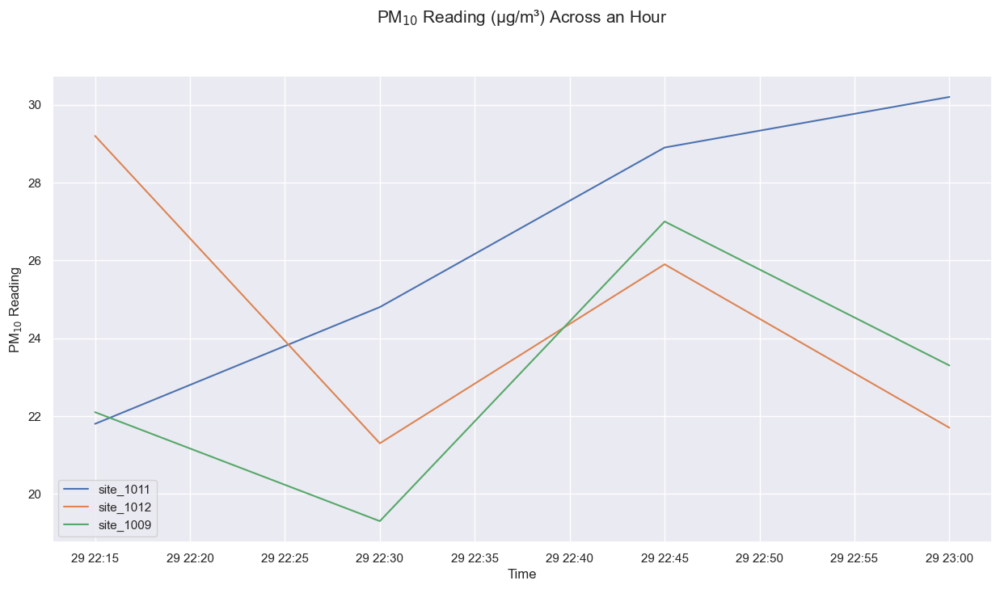

In [10]:
# Plot the PM10 readings over time
sns.set_theme()
fig, ax = plt.subplots(figsize=(15, 7.5))

ax.plot(site1011_10['local_time'], site1011_10['value'], label = 'site_1011')
ax.plot(site1012_10['local_time'], site1012_10['value'], label = 'site_1012')
ax.plot(site1009_10['local_time'], site1009_10['value'], label = 'site_1009')

ax.set_xlabel("Time")
ax.set_ylabel("PM$_{10}$ Reading")
ax.set_title("PM$_{10}$ Reading (µg/m\u00b3) Across an Hour", y=1.1, fontsize=15)

plt.legend()
plt.show()

 Three sites had measurements of PM10 recorded over an hour period. All sites show PM10 values at a range between 19ug/m3 and 30ug/m3 at the time of measurement. Site 1012 recorded the lowest measurement, 19ug/m3, at 10:30pm and site 1011 recorded the highest value of 30.5ug/m3 at 11pm.

##### Investigate the measurements of Particulate Matter 2.5ug/m^3 in size at each location

PM2.5 are also air pollutant particles, commonly found in smoke. They have a size of 0.0025mm or smaller. PM2.5 particles can impact the health of people living in Melbourne city, but are of greater concern than PM10 particles as PM2.5 can penetrate deep in the lungs and make their way into the bloodstream of people exposed to them <a href="#fn-5">[5]</a> .

In [11]:
# Make a dataframe with only the PM2.5 values
micro_PM2_5 = micro_data.loc[micro_data['type'] == 'PM2.5']
micro_PM2_5.shape

(12, 9)

In [12]:
# Split the PM2.5 dataframe into 3 dataframes, one for each site
site_ids = [1011, 1012, 1009]
site_dfs = []

for site_id in site_ids:
    # Select site id from list, add only values form one site id to side_id dataframe
    site_df = micro_PM2_5.loc[micro_PM2_5['site_id'] == site_id]
    # Sort values into time order
    site_df = site_df.sort_values(by='local_time')
    # Select only the local_time and value variables from the dataframe
    site_df = site_df[['local_time', 'value']]
    # Set local time to datetime object
    site_df['local_time'] = pd.to_datetime(site_df['local_time'] )
    # Round time time nearest minute
    site_df["local_time"] = site_df["local_time"].dt.floor('1min')
    # Add site_df to the dataframe
    site_dfs.append(site_df)
    
site1011_2_5 = site_dfs[0]
site1012_2_5 = site_dfs[1]
site1009_2_5 = site_dfs[2]

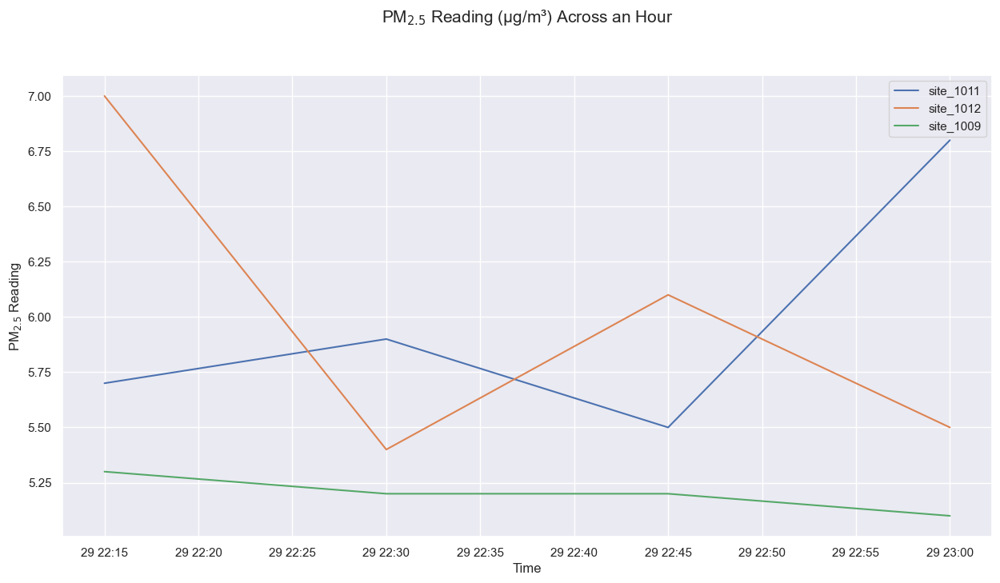

In [13]:
# Plot the PM2.5 readings over time
sns.set_theme()
fig, ax = plt.subplots(figsize=(15, 7.5))

ax.plot(site1011_2_5['local_time'], site1011_2_5['value'], label = 'site_1011')
ax.plot(site1012_2_5['local_time'], site1012_2_5['value'], label = 'site_1012')
ax.plot(site1009_2_5['local_time'], site1009_2_5['value'], label = 'site_1009')

ax.set_xlabel("Time")
ax.set_ylabel("PM$_{2.5}$ Reading")
ax.set_title("PM$_{2.5}$ Reading (µg/m\u00b3) Across an Hour", y=1.1, fontsize=15)

plt.legend()
plt.show()

 The same three sites had measurements of PM2.5 recorded over an hour period. Site 1109 has the lowest range in PM2.5 measurements, with all times recording values close to 5.25ug/m3. Sites 1011 and 1012 show PM2.5 values at a range between 5.4ug/m3 and 7ug/m3 at the time of measurement. The highest value recorded was 7ug/m3 at 10:15pm at site 1012.

##### View the average hourly particulate matter at each site

The EPA AirWatch uses air quality categories to assess air quality. These categories are based on particle count numbers on average per hour and per day. As there is only an hour of data availible, the daily average can be categorised for each location.

In [14]:
# For PM10 data
# Select the necessary rows only
mini_micro_PM10 = micro_PM10[['site_id','value']]
# Group by site id and find the mean of each group
mini_micro_PM10 = mini_micro_PM10.groupby(['site_id']).mean().reset_index()
# Convert site ids to strings
mini_micro_PM10['site_id'] = mini_micro_PM10['site_id'].astype('string')

In [15]:
# For PM2.5 data
# Select the necessary rows only
mini_micro_PM2_5 = micro_PM2_5[['site_id','value']]
# Group by site id and find the mean of each group
mini_micro_PM2_5 = mini_micro_PM2_5.groupby(['site_id']).mean().reset_index()
# Convert site ids to strings
mini_micro_PM2_5['site_id'] = mini_micro_PM2_5['site_id'].astype('string')


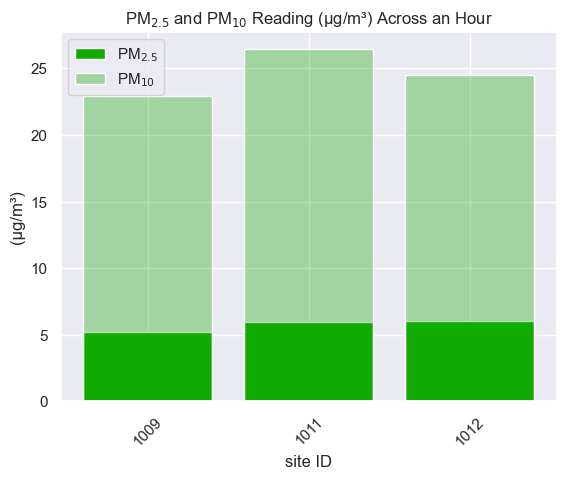

In [16]:
# Bar plot of PM2.5 and PM10 data
plt.bar(mini_micro_PM2_5['site_id'],mini_micro_PM2_5['value'], color="#1a0", label="PM$_{2.5}$") 
plt.bar(mini_micro_PM10['site_id'],mini_micro_PM10['value'], color="#1a05", label="PM$_{10}$") 
plt.title('PM$_{2.5}$ and PM$_{10}$ Reading (µg/m\u00b3) Across an Hour')
plt.xlabel('site ID')
plt.xticks(rotation=45)
plt.ylabel('(µg/m\u00b3)')
plt.legend()
plt.show()

The average PM2.5 reading hovers around 5.25 at all sites. The EPA categorises this level as good air quality, as it is less than 25 ug/m3 <a href="#fn-5">[5]</a>. The average PM10 score is between 23ug/m3 and 27ug/m3 at all sites. This is also categorised as good air quality as it is below the threshold of 40ug/m3 <a href="#fn-4">[4]</a>.

## Microclimate sensor locations 

It would be useful to identify the sensor locations on a map, so an additional dataset will need to be loaded and combined to view this.

In [17]:
# IMPORT MICROCLIMATE SENSOR LOCATIONS DATASET
# Set dataset_id to query for the API call dataset name
dataset_id = 'microclimate-sensor-locations'
# Save dataset to df varaible
micro_loc = collect_data(dataset_id)
# Check number of records in df
print(f'The dataset contains {len(micro_loc)} records.')
# View df
micro_loc.head(3)

The dataset contains 16 records.


,site_id,gatewayhub_id,site_status,last_data_local,start_reading,end_reading,latitude,longitude,location
0,1004,arc1048,R,NaN,2019-11-15,2021-06-13,-37.800575,144.964635,"-37.800575, 144.964635"
1,1006,arc1112,R,NaN,2021-05-20,2021-06-28,-37.822486,144.952065,"-37.822486, 144.952065"
2,1011,arc1055,C,NaN,2021-07-07,NaN,-37.822222,144.952222,"-37.822222, 144.952222"


In [18]:
# Merging sensor location data with sensor reading data.
# Merge dataframes on site_id value
micro = pd.merge(micro_data, micro_loc, on='site_id')
# Drop duplicates and columsn with NaN data
micro = micro.drop(['gatewayhub_id_y', 'end_reading', 'last_data_local', 'site_status_y'], axis=1)
# Automatically convert datatypes based on column values
micro = micro.convert_dtypes()
# Drop retired sensors
micro = micro[micro['site_status_x'] != 'R']
micro.head(3)

,local_time,id,site_id,sensor_id,value,type,units,gatewayhub_id_x,site_status_x,start_reading,latitude,longitude,location
0,2023-11-29 22:15:02+00:00,8110553,1011,5b,74.38,TPH.RH,%,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222"
1,2023-11-29 22:15:02+00:00,8110558,1011,5c,1010.8,TPH.PRESSURE,hPa,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222"
2,2023-11-29 22:15:03+00:00,8110562,1011,6,0.0,WS,km/h,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222"


In [19]:
# Get unique locations from microdata
micro_loc = micro.drop_duplicates(subset=['site_id'])
# Convert to geo-dataframe
gdf_micro_loc = gpd.GeoDataFrame(micro_loc, geometry=gpd.points_from_xy(micro_loc['latitude'], micro_loc['longitude']))
gdf_micro_loc.head(3)

,local_time,id,site_id,sensor_id,value,type,units,gatewayhub_id_x,site_status_x,start_reading,latitude,longitude,location,geometry
0,2023-11-29 22:15:02+00:00,8110553,1011,5b,74.38,TPH.RH,%,arc1055,C,2021-07-07,-37.822222,144.952222,"-37.822222, 144.952222",POINT (-37.822 144.952)
24,2023-11-29 22:15:04+00:00,8110606,1012,6,0.0,WS,km/h,arc1048,C,2021-09-17,-37.813333,144.97,"-37.813333, 144.97",POINT (-37.813 144.970)
48,2023-11-29 22:15:11+00:00,8110489,1009,0a,5.3,PM2.5,ug/m^3,arc1050,C,2021-06-14,-37.816868,144.965705,"-37.81686763, 144.96570467",POINT (-37.817 144.966)


In [20]:
# Initialize the map at Melbourne and store it in a m object
m = folium.Map(location = [-37.815, 144.96],zoom_start = 14)

# Add bus stop locations
for i in range(0,len(gdf_micro_loc)):
   folium.Marker(
      location=[gdf_micro_loc.iloc[i]['latitude'], gdf_micro_loc.iloc[i]['longitude']],
      popup=gdf_micro_loc.iloc[i]['site_id'],
      icon=folium.Icon(color="purple",prefix='fa', icon='microscope'),
   ).add_to(m)

# A title can be added to the map, if desired.
m.get_root().html.add_child(folium.Element("<h3 align='center'>Locations of microsensors</h3>"))

# Show the map
m

Locations of micro sensors are shown on the map with a green marker. The map shows the name of each of the micro sensors when the info pin is clicked on. Site 1011 is in the Siddelely Street carpark, 1009 is in Flinders Lane and 1012 is on Little Collins Street.

In summary, from the information availible on Melbourne Open data website, air quality in Melbourne is at an acceptable level. However, there is little data availible and the time of collection is late at night so the data is not seen a a general representation of Melbourne Air Quality. As this dataset incrases, a more accurate understanding of air quality will be able to be made.

Green walls have been shown to impact microfauna numbers. Microfauna (butterflies and Insect) data will be imported and analysed next.

## Butterfly Survey Data

In [21]:
# IMPORT BUTTERFLY DATASET
# Set dataset_id to query for the API call dataset name
dataset_id = 'butterfly-biodiversity-survey-2017'
# Save dataset to df varaible
butterfly = collect_data(dataset_id)
# Check number of records in df
print(f'The dataset contains {len(butterfly)} records.')
# View df
butterfly.head(3)

The dataset contains 4056 records.


,site,sloc,walk,date,time,vegwalktime,vegspecies,vegfamily,lat,lon,temp,hum,win1,win2,win3,win4,win,per,sur,prap,vker,vite,blue,dpet,dple,pana,pdem,hesp,esmi,cato,gaca,belo,tabe,brow,csem,aand,jvil,paur,ogyr,gmac,datetime,location
0,Murchinson Square,1,1,2017-01-26,0001-01-01T10:10:00+00:00,0.2306,Asteraceae 1,Asteraceae,-37.8001,144.9729,22.1,65.4,2.3,0.9,1.1,2.8,2.8,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2017-01-26T10:10:00+00:00,"-37.8001, 144.9729"
1,Fitzroy-Treasury Gardens,3,1,2017-09-03,0001-01-01T10:21:00+00:00,0.1818,Begonia sp.,Begoniaceae,-37.8143,144.9814,24.4,60.6,0.0,0.4,0.0,0.0,0.4,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2017-03-09T10:21:00+00:00,"-37.8143, 144.9814"
2,Westgate Park,4,3,2017-03-03,0001-01-01T17:27:00+00:00,1.3333,Xerochrysum viscosum,Asteraceae,-37.8303,144.9102,31.0,48.0,0.6,0.7,0.8,0.0,0.8,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2017-03-03T17:27:00+00:00,"-37.8303, 144.9102"


As biodiversity is of consideration, viewing the numbers of each butterfly species would be advantageous.

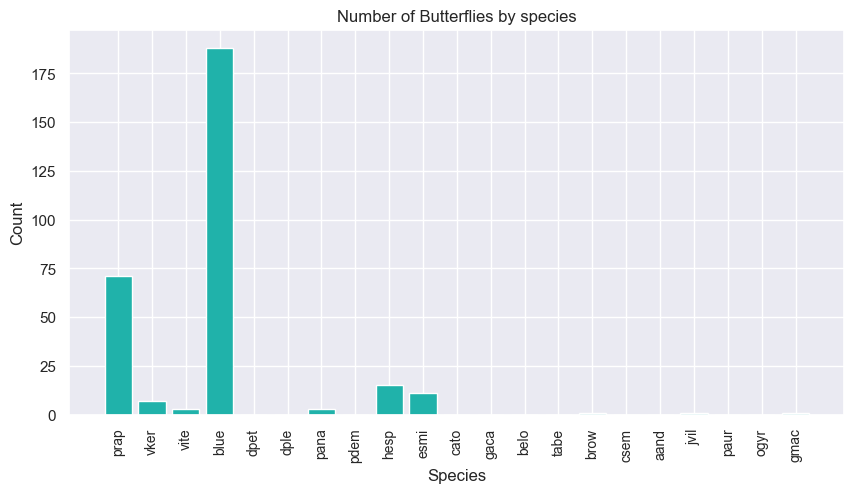

In [22]:
# Select columns from butterfly dataframe
butterfly_species = butterfly.loc[:, 'prap':'gmac']
# Set sum the columns
butterfly_species = butterfly_species.sum(axis=0)
# Convert Series object into dataframe
butterfly_species = pd.DataFrame({'species':butterfly_species.index, 'count':butterfly_species.values})


# Plot of butterfly species
fig = plt.figure(figsize = (10, 5))
 
# creating the bar plot
plt.bar(butterfly_species["species"], butterfly_species["count"], color ='lightseagreen', width = 0.8)
 
plt.xlabel("Species")
plt.xticks(rotation=90, fontsize=10)
plt.ylabel("Count")
plt.title("Number of Butterflies by species")
plt.show()

Melbourne City data maps the species anmes to their initialisms <a href="#fn-6">[6]</a>, and can be seen in the table here: 
<div align = "center">

| initialism |                Name                |
|:----------:|:----------------------------------:|
|    prap    |     Pieris rapae                   |
|    vker    |     Vanessa kershawi               |
|    vite    |     Vanessa itea                   |
|    blue    |     Little blue butterfly group    |
|    dpet    |     Danaus petilia                 |
|    dple    |     Danaus plexippus               |
|    pana    |     Papilio anactus                |
|    pdem    |     Papilio demoleus               |
|    hesp    |     Hesperiidae group              |
|    esmi    |     Eurema smilax                  |
|    cato    |     Catopsilia group               |
|    gaca    |     Geitoneura acanthi             |
|    belo    |     Delias/Belonis group           |
|    tabe    |     Tisiphone abeona               |
|    brow    |     Brown buttefly group           |
|    csem    |     Charaxes semipronius           |
|    aand    |     Acraea andromacha              |
|    jvil    |     Junonia villida                |
|    ogyr    |     Hypochrysops/Ogyris group      |
|    gmac    |     Graphium macleayanum           |

</div>

The species graph shows the most prevalent butterfly was the Little blue butterfly group butterflies with more than 100 of this species observed than the next most observed butterfly. Pieris rapae then had 50 more specimens observed than the third most prevaent which was the Hesperiidae group. All other species had less than 10 butterflies counted during the survey.

As location is used for optimisation of green wall locations, counting the total butterflies at each location is necessary.

In [23]:
# Aggregating the butterfly data as count of variety of species by monitoring location
bfly_counts = butterfly.groupby(["site"])["site"].count().reset_index(name="Butterfly Total")
# Renaming the monitoring location column to location
bfly_counts = bfly_counts.rename({'site': 'location'}, axis=1) 
# Check number of records in df
print(f'The dataset contains {len(bfly_counts)} records.')
# View data
bfly_counts.head(3)

The dataset contains 15 records.


,location,Butterfly Total
0,Argyle Square,256
1,Canning/Neill St Reserve,40
2,Carlton Gardens South,592


The total of butterflies at each location will be joined with insect data from city of Melbourne.

## Insect Survey Data

In [24]:
# IMPORT INSECT DATASET
# Set dataset_id to query for the API call dataset name
dataset_id = 'insect-records-in-the-city-of-melbourne-from-little-things-that-run-the-city'
# Save dataset to df varaible
insect = collect_data(dataset_id)
# Check number of records in df
print(f'The dataset contains {len(insect)} records.')
# View df
insect.head(3)

The dataset contains 1295 records.


,taxa,kingdom,phylum,class,order,family,genus,species,identification_notes,location,sighting_date
0,Insect,ANIMALIA,ARTHROPODA,INSECTA,COLEOPTERA,LATRIIDAE,Cortinicara,NaN,Cortinicara sp.1,Royal Park,NaN
1,Insect,ANIMALIA,ARTHROPODA,INSECTA,COLEOPTERA,LATRIIDAE,Cortinicara,NaN,Cortinicara sp.1,Westgate Park,NaN
2,Insect,ANIMALIA,ARTHROPODA,INSECTA,HEMIPTERA,PSYLLIDAE,Creiis,NaN,Creiis sp. 1,Royal Park,NaN


As with butterfly data, biodiversity is of consideration. Thus it is nescessary to view numbers of each insect variety. As the species column is missing values, it will be excluded and instead insects will be counted by genus. To do this, a new column will need to be added to the insect dataframe to show that a species has been seen and give the ability to sum the total times each species was observed.

In [25]:
# Add a column with default value 1 for insect sighting = True
insect = insect.assign(sighting = 1)

# Set grouping for aggregated dataframe
groupbyfields = ['order','family','genus','identification_notes']
aggregatebyfields = ["sum"]

# Create new DataFrame with sum of each insect species.
insect_species = pd.DataFrame(insect.groupby(groupbyfields)['sighting'].agg(aggregatebyfields).astype(int).add_prefix('total'))
# Add in an index column
insect_species = insect_species.reset_index()

# Check number of records in df
print(f'The dataset contains {len(insect_species)} records.')
insect_species.head(3)

The dataset contains 148 records.


,order,family,genus,identification_notes,totalsum
0,COLEOPTERA,ADERIDAE,Aderus,Aderus sp. 1,1
1,COLEOPTERA,ADERIDAE,Syzeton,Syzeton sp. 1 (abnormis group),1
2,COLEOPTERA,ANTHICIDAE,Omonadus,Omonadus sp. 1 (hesperi group),4


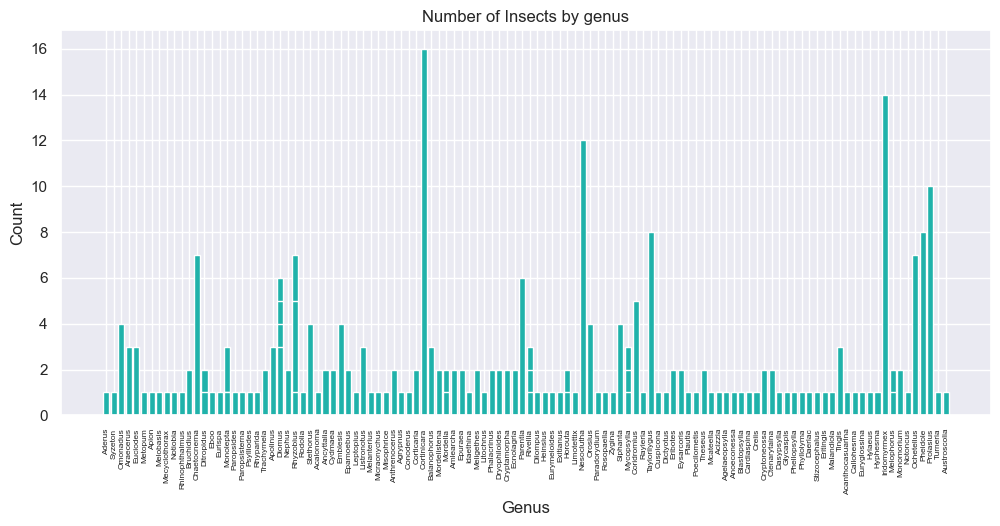

In [26]:
# Plot of insect species
fig = plt.figure(figsize = (12, 5))
 
# creating the bar plot
plt.bar(insect_species["genus"], insect_species["totalsum"], color ='lightseagreen', width = 0.8)
 
plt.xlabel("Genus")
plt.xticks(rotation=90, fontsize=6)
plt.ylabel("Count")
plt.title("Number of Insects by genus")
plt.show()

Many of the insects in the dataset were only counted on one occasion. It is however difficult to ascertan the names of the genus with grater numbers due to the large number of categories. As insect names are hard to read in a barplot, data can also be presented as a word cloud, with larger words indicating more numbers of the genus present.

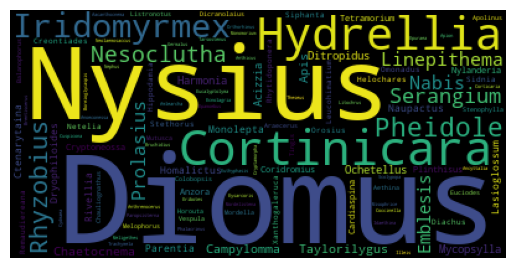

In [27]:
# Drop NA values
new = insect["genus"].dropna(how='any')
# COnvert data to a string list
text = " ".join(review for review in new.astype(str))

# Generate the word cloud with no repetition of words
wordcloud = WordCloud(collocations=False).generate(text)

# Display the word cloud
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

 The insect that was seen the most was from genus Diomus, which is a type of lady beetle. This was closely followed by genus Iridomyrmex, which is a grey chinch bug. 

Location of insect sightings is also essential, as this task focuses on finding the optimal location for green wall locations to enhance existing biodiversity. To achieve this, insect data will be re-summed by geographical data, combined with butterfly data and then mapped.

In [28]:
#Aggregating the insect data as count of individual species by monitoring location.
insect_counts = insect.groupby(["location"])["location"].count().reset_index(name="Insect Total")
#Creating id index
insect_counts.insert(0, 'id', range(1, 1 + len(insect_counts)))
# Check number of records in df
print(f'The dataset contains {len(insect_counts)} records.')
# View data
insect_counts

The dataset contains 15 records.


,id,location,Insect Total
0,1,Argyle Square,43
1,2,Canning/Neil Street Reserve,14
2,3,Carlton Gardens South,97
3,4,Fitzroy-Treasury Gardens,150
4,5,Gardiner Reserve,24
5,6,Garrard Street Reserve,26
6,7,Lincoln Square,37
7,8,Murchinson Square,14
8,9,Pleasance Gardens,42
9,10,Princes Park,177


The dataset of insect counts has the location as a name. Geographical data of the locations needs to be added. The latitude and longitude have been taken from external website LatLong.net <a href="#fn-7">[7]</a>.This geographic information system is free and open-source, supporting viewing and analysis of geospatial data. Location names have been mapped to their geographical co-ordinates manually using information from LatLong.net. These will be added to the insect dataset.

In [29]:
# Creating point data shapefile to align with the monitoring locations.
latitude = [-37.80260,-37.79299,-37.80522,-37.81427,-37.79902,-37.79426,-37.80268,-37.86180,-37.79616,-37.78480,-37.79275,-37.80994,-37.80121,-37.83239,-37.79089]
longitude = [144.96580,144.97394,144.97137,144.97598,144.94385,144.95150,144.96287,145.00553,144.94562,144.96142,144.95451,144.96444,144.96041,144.90773,144.92368]

insect_counts['latitude'] = latitude
insect_counts['longitude'] = longitude
# View dataframe
insect_counts.head(3)

,id,location,Insect Total,latitude,longitude
0,1,Argyle Square,43,-37.80260,144.96580
1,2,Canning/Neil Street Reserve,14,-37.79299,144.97394
2,3,Carlton Gardens South,97,-37.80522,144.97137


In [30]:
# Combine butterfly data to insect data
# Change bfly counts site to Location
bfly_counts = bfly_counts.rename(columns={'site': 'Location'})
# Merge insect and butterfly data
insect_total = pd.merge(left=insect_counts, right=bfly_counts, how='left', left_on='location', right_on='location')
# convert na values to 0 (for dditional data in insect column with no butterflies)
insect_total = insect_total.fillna(0)
# Sum counts of insects and butterflies in each location
insect_total['Total Insect Count'] = insect_total["Butterfly Total"] + insect_total["Insect Total"]
# Combine latitude and longitude to make geometry column
gdf_insect_total = gpd.GeoDataFrame(insect_total, geometry=gpd.points_from_xy(insect_total.longitude, insect_total.latitude))
# Show df
gdf_insect_total.head(3)

,id,location,Insect Total,latitude,longitude,Butterfly Total,Total Insect Count,geometry
0,1,Argyle Square,43,-37.80260,144.96580,256.0,299.0,POINT (144.96580 -37.80260)
1,2,Canning/Neil Street Reserve,14,-37.79299,144.97394,0.0,14.0,POINT (144.97394 -37.79299)
2,3,Carlton Gardens South,97,-37.80522,144.97137,592.0,689.0,POINT (144.97137 -37.80522)


In [49]:
# Initialize the map at Melbourne and store it in a m object
m = folium.Map(location = [-37.815, 144.96],zoom_start = 14)

# Add insect locations
for i in range(0,len(insect_total)):
   folium.Marker(
      location=[insect_total.iloc[i]['latitude'], insect_total.iloc[i]['longitude']],
      popup='Insects = {}, Butterflies = {}, Total ={}'.format(
                  insect_total['Insect Total'].values[i],
                  insect_total['Butterfly Total'].values[i],
                  insect_total['Total Insect Count'].values[i]),
      icon=folium.Icon(color="green",prefix='fa', icon='bug'),
   ).add_to(m)
   
# A title can be added to the map, if desired.
m.get_root().html.add_child(folium.Element("<h3 align='center'>Locations of insect sightings</h3>"))

# Show the map
m

Locations of insect sightings are shown on the map with a green marker. The map shows the count of insects, butterflies and a total count of insects observed in the location. Insect sightings were made over a large geographical area, from Kensington to East Melbourne to Carlton North.

While insect sightings occurred over a large area (both butterflies and other insects), few insects were seen and of that there was little variation. This shows the need for green walls to assist in creating more diverse environments and boosting diversty of insect life.

Now that microfauna and pollutant datasets have been loaded and analysed, pedestrian data will be imported. 

## Pedestrian Counting System (counts per hour)

In [32]:
# IMPORT PEDESTRIAN COUNTS DATASET
# Set dataset_id to query for the API call dataset name
dataset_id = 'pedestrian-counting-system-monthly-counts-per-hour'
# Save dataset to df varaible
ped_count = collect_data(dataset_id)
# Check number of records in df
print(f'The dataset contains {len(ped_count)} records.')
# View df
ped_count.head(3)

The dataset contains 549976 records.


,sensor_name,timestamp,locationid,direction_1,direction_2,total_of_directions,location
0,SprFli_T,2023-04-24T21:00:00+00:00,75,36,17,53,"-37.81515276, 144.97467661"
1,SprFli_T,2023-04-25T00:00:00+00:00,75,28,50,78,"-37.81515276, 144.97467661"
2,SprFli_T,2023-04-25T01:00:00+00:00,75,63,63,126,"-37.81515276, 144.97467661"


In [33]:
ped_counta = ped_count


In [34]:
# Pedestrain data pre-processing
# Drop columns not being used
ped_count = ped_count.drop([0,3,4])
# Split location data into two columns
# Create separate columns for latitude and longitude
ped_count[['latitude','longitude']] = ped_count['location'].str.split(', ',expand=True)
# Convert data types
ped_count[[ 'locationid', 'total_of_directions']] = ped_count[['locationid', 'total_of_directions']].astype(int)
ped_count = ped_count.convert_dtypes()
# View datatype in each column
ped_count.dtypes

sensor_name            string[python]
timestamp              string[python]
locationid                      Int32
direction_1                     Int64
direction_2                     Int64
total_of_directions             Int32
location               string[python]
latitude               string[python]
longitude              string[python]
dtype: object

As location is of importance, an average of pedestrians at each location should be obtained.

In [35]:
# Set grouping for aggregated dataframe
groupbyfields = ['locationid','location','latitude','longitude']
aggregatebyfields = ["mean"]

# Create new DataFrame with mean values for each site.
ped_count_mean = pd.DataFrame(ped_count.groupby(groupbyfields)['total_of_directions'].agg(aggregatebyfields).astype(int)
                           .add_prefix('hourly_counts_'))
# Add in an index column
ped_count_mean = ped_count_mean.reset_index()
# Convert sensor ids to strings
ped_count_mean['locationid'] = ped_count_mean['locationid'].astype('string')
# Check number of records in df
print(f'The dataset contains {len(ped_count_mean)} records.')
ped_count_mean.head(3)

The dataset contains 93 records.


,locationid,location,latitude,longitude,hourly_counts_mean
0,1,"-37.81349441, 144.96515323",-37.81349441,144.96515323,1029
1,2,"-37.81380668, 144.96516718",-37.81380668,144.96516718,621
2,3,"-37.81101524, 144.96429485",-37.81101524,144.96429485,1199


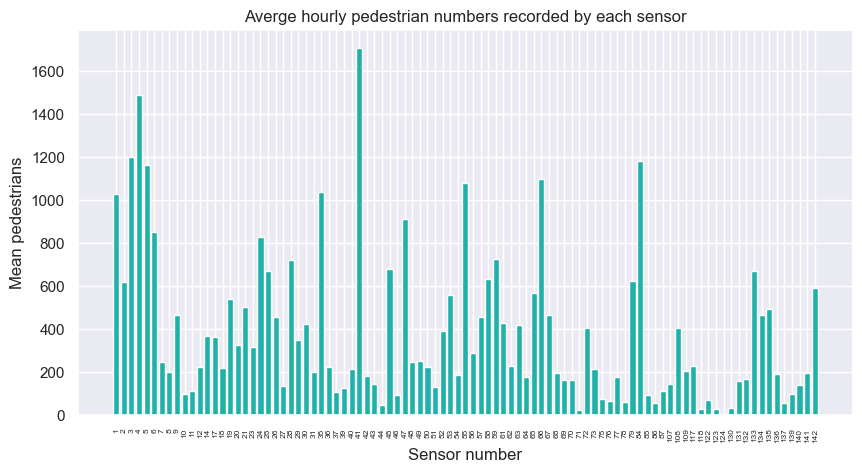

In [36]:
# Plot of average pedestrian counts per sensor
fig = plt.figure(figsize = (10, 5))
 
# creating the bar plot
plt.bar(ped_count_mean["locationid"], ped_count_mean["hourly_counts_mean"], color ='lightseagreen', width = 0.8)
 
plt.xlabel("Sensor number")
plt.xticks(rotation=90, fontsize=6)
plt.ylabel("Mean pedestrians")
plt.title("Averge hourly pedestrian numbers recorded by each sensor")
plt.show()

The mean count of pedestrians at each sensor location is shown in the bar graph. The sensor at location 41 has the highest average hourly number of pedestrians at 1700. Sensor location 124 has so few average hourly pedestrians that the value is not viewable on this graph. There is much variation in the average numbers of pedestrians that it may be useful to view the locations of the pedestrian count data.

It would also be useful to look at the count locations of pedestrian data.

In [37]:
# Convert to geo-dataframe
gdf_ped_count_mean = gpd.GeoDataFrame(ped_count_mean, geometry=gpd.points_from_xy(ped_count_mean['latitude'], ped_count_mean['longitude']))
# View dataframe
gdf_ped_count_mean.head(3)

,locationid,location,latitude,longitude,hourly_counts_mean,geometry
0,1,"-37.81349441, 144.96515323",-37.81349441,144.96515323,1029,POINT (-37.813 144.965)
1,2,"-37.81380668, 144.96516718",-37.81380668,144.96516718,621,POINT (-37.814 144.965)
2,3,"-37.81101524, 144.96429485",-37.81101524,144.96429485,1199,POINT (-37.811 144.964)


In [38]:
gdf_ped_count_mean.dtypes

locationid            string[python]
location              string[python]
latitude              string[python]
longitude             string[python]
hourly_counts_mean             int32
geometry                    geometry
dtype: object

In [48]:
# Initialize the map at Melbourne and store it in a m object
m = folium.Map(location = [-37.815, 144.96],zoom_start = 14)

# Add bus stop locations
for i in range(0,len(gdf_ped_count_mean)):
   folium.Marker(
      location=[gdf_ped_count_mean.iloc[i]['latitude'], gdf_ped_count_mean.iloc[i]['longitude']],
      popup='Hourly mean pedestrians = {}'.format(
                  gdf_ped_count_mean['hourly_counts_mean'].values[i]),
      icon=folium.Icon(color="pink",prefix='fa', icon='male'),
   ).add_to(m)
   
# A title can be added to the map, if desired.
m.get_root().html.add_child(folium.Element("<h3 align='center'>Locations of Pedestrian counts</h3>"))

# Show the map
m

Locations of pedestrian counters are shown on the map with a pink marker. When clicked on, the map shows the ID of the sensor as well as the mean hourly pedestrian count at the location when the info pin is clicked on. Pedestrian counters are in a large geographical area, from Kensington and North Melbourne to Southbank and Fitzroy. A clustering map allows greater visualisation of areas of concentrated pedestrian patterns.

In [40]:
def map_visualization(data):
    locations = []
    for i in range(len(data)):
        row =data.iloc[i]
        location = [(row.latitude,row.longitude)]*int(row.hourly_counts_mean)
        locations += location
      
    marker_cluster  = MarkerCluster(
      locations=locations,
      overlay=True,
      control=True,
      )
    m = folium.Map(location=[-37.8167, 144.967], zoom_start=15)
    marker_cluster.add_to(m)

    folium.LayerControl().add_to(m)
    
    m
    return m
map_visualization(gdf_ped_count_mean)

Locations of higher density of pedestrians can be viewed on the map above. As the map opens, it can be seen that Flinders street area has the highest mean averages of pedestrians and Southbank has the fewest. By using the zoom function, more secific geographical locations of centred pedestrian activity can be viewed. While the clustering map allows general locations of high foottraffci areas, geo-clustering models can pinpoint central geographical locations of high pedestrian activities.

The pedestrian numbers, as well as insect sighting locations, will be used to build a model to report the best locations for green walls.

# OPTIMISATION MODELING

The role of this use case is to determine the optimal location of green walls in the City of Melbourne. This will be done using a clustering method. Clustering is choosen as it works well on unlablled data, and the data in this has no labels in terms of belinging to particular geographical clusters. The clustering method will find the centroid locations of the top 100,000 pedestrian count locations. Pedestrian data is selected as the feature of importance as studies have linked green spaces to imporved wellbeing in humans <a href="#fn-1">[1]</a>, so greater exposure of humans to locations of green walls will have more impact on the City of Melbourne population. Also of interest are locations where insect numbers are lower, as insect biodiversity is boosted by increasing the habitat area by creatng green walls. 

In [41]:
# Sort the ped count values in descending order
max_ped_count = ped_count.sort_values(by ='total_of_directions', ascending = False) 
# Select the top 100000 pedestrian count rows
max_ped = max_ped_count.head(100000)
# Convert the latitude and longitude to float data to use in k-means clusterid 
max_ped[[ 'latitude','longitude']] = max_ped[['latitude','longitude']].astype(float)
# View data
max_ped.head(3)

,sensor_name,timestamp,locationid,direction_1,direction_2,total_of_directions,location,latitude,longitude
221137,BouBri_T,2023-05-05T12:00:00+00:00,57,8900,1487,10387,"-37.8176735, 144.95025594",-37.817673,144.950256
356907,BouBri_T,2023-07-21T12:00:00+00:00,57,8333,1163,9496,"-37.8176735, 144.95025594",-37.817673,144.950256
217186,BouBri_T,2023-07-21T09:00:00+00:00,57,1081,8089,9170,"-37.8176735, 144.95025594",-37.817673,144.950256


First, the top 100,000 pedestrian count values was selected from the pedestrian count dataframe. The method choosen for clustering is k-means. This is because the locations clusters are assumed to be elliptical in shape. The k-value is the number of green walls that will be constructed. In this use case, 10 green walls will be constructed. The results of the clustering method will be shown, as well as the geograhical location of green wall locations in both a map and table.

In [42]:
# Set K value to the number of green walls constructed
k = 10
# Initiate model
model = cluster.KMeans(n_clusters=k, init='k-means++')

# Copy dataframe to new variable
ped_counts_k = max_ped
# Select only latitude and longtude columns
X = ped_counts_k[["latitude","longitude"]]
# Set a copy of the X dataframe
dtf_X = X.copy()

# Fit model to data
dtf_X["cluster"] = model.fit_predict(X)

# Find the centroids
closest, distances = scipy.cluster.vq.vq(model.cluster_centers_, 
                     dtf_X.drop("cluster", axis=1).values)
# Default the clusters column to 0
dtf_X["centroids"] = 0
# Set cluster value to 1 for cluster columns
for i in closest:
    dtf_X["centroids"].iloc[i] = 1
    
# Add clustering info to the ped_counts_k dataset
ped_counts_k[["cluster","centroids"]] = dtf_X[["cluster","centroids"]]
# View data
ped_counts_k.head(3)

,sensor_name,timestamp,locationid,direction_1,direction_2,total_of_directions,location,latitude,longitude,cluster,centroids
221137,BouBri_T,2023-05-05T12:00:00+00:00,57,8900,1487,10387,"-37.8176735, 144.95025594",-37.817673,144.950256,1,0
356907,BouBri_T,2023-07-21T12:00:00+00:00,57,8333,1163,9496,"-37.8176735, 144.95025594",-37.817673,144.950256,1,0
217186,BouBri_T,2023-07-21T09:00:00+00:00,57,1081,8089,9170,"-37.8176735, 144.95025594",-37.817673,144.950256,1,0


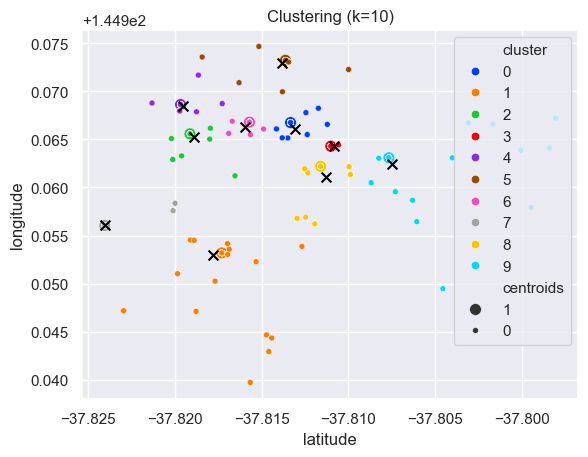

In [43]:
# Plot data
fig, ax = plt.subplots()

# Plot clusters by colour 
sns.scatterplot(x="latitude", y="longitude", data=ped_counts_k, 
                palette=sns.color_palette("bright",k),
                hue='cluster', size="centroids", size_order=[1,0],
                legend="brief", ax=ax).set_title('Clustering (k='+str(k)+')')
# Plot centroids as X 
th_centroids = model.cluster_centers_
ax.scatter(th_centroids[:,0], th_centroids[:,1], s=50, c='black', 
           marker="x")
# Show the plot
plt.show()

The results of k-means classification show the locations of data from the dataset in the coloured dots and their cluster groupings for visual inspection. It is seen that the blue cluster is over the smallest geographical area and the grey cluster falls over the greatest geographical area. Black crosses mark the locations of the cluster centres, i.e. the optimal locations of green walls. These cluster centres will also be shown in a folium map to better visualise their locations relative to the layout of Melbourne City.

In [44]:
# Select centroid locations from ped counts K dataset
ped_counts_centroid = ped_counts_k.loc[ped_counts_k['centroids']==1]
# Convert to geo-dataframe
gdf_ped_counts_centroid = gpd.GeoDataFrame(ped_counts_centroid, geometry=gpd.points_from_xy(ped_counts_centroid['latitude'], ped_counts_centroid['longitude']))
# View dataframe
gdf_ped_counts_centroid.head(3)

,sensor_name,timestamp,locationid,direction_1,direction_2,total_of_directions,location,latitude,longitude,cluster,centroids,geometry
532746,FliS_T,2024-02-20T06:00:00+00:00,6,4888,2479,7367,"-37.81911705, 144.96558255",-37.819117,144.965583,2,1,POINT (-37.819 144.966)
490797,AG_T,2024-03-10T10:00:00+00:00,29,4930,996,5926,"-37.81965809, 144.96863453",-37.819658,144.968635,4,1,POINT (-37.820 144.969)
259797,MCEC_T,2023-12-26T02:00:00+00:00,25,2661,2299,4960,"-37.82401776, 144.95604426",-37.824018,144.956044,7,1,POINT (-37.824 144.956)


In [50]:
# Initialize the map at Melbourne and store it in a m object
m = folium.Map(location = [-37.815, 144.96],zoom_start = 14)

# Add ped_count centroids locations
for i in range(0,len(ped_counts_centroid)):
   folium.Marker(
      location=[ped_counts_centroid.iloc[i]['latitude'], ped_counts_centroid.iloc[i]['longitude']],
      popup='Latitude = {}, Longitude = {}'.format(
                  ped_counts_centroid['latitude'].values[i],
                  ped_counts_centroid['longitude'].values[i]),
      icon=folium.Icon(color="red",prefix='fa', icon='star')
   ).add_to(m)

# Add insect locations
for i in range(0,len(insect_total)):
   folium.Marker(
      location=[insect_total.iloc[i]['latitude'], insect_total.iloc[i]['longitude']],
      icon=folium.Icon(color="green",prefix='fa', icon='bug'),
   ).add_to(m)
   
# A title can be added to the map, if desired.
m.get_root().html.add_child(folium.Element("<h3 align='center'>Optimal Locations of Green Walls</h3>"))

# Show the map
m

In [46]:
# Save latitude and longitude of the centroids to new dataframe
green_wall = ped_counts_centroid[['latitude','longitude']].reset_index(drop=True)
print("Optimal locations of Green Walls:")
# Print dataframe
green_wall

Optimal locations of Green Walls:


,latitude,longitude
0,-37.819117,144.965583
1,-37.819658,144.968635
2,-37.824018,144.956044
3,-37.811015,144.964295
4,-37.817286,144.953191
5,-37.807675,144.963091
6,-37.815694,144.966806
7,-37.811603,144.962201
8,-37.813625,144.973236
9,-37.813331,144.966756


The map and table above give the optimal locations for Green Walls in Melbourne city to enhance their exposure to footraffic. The map indicates optimal green wall location with a red star and this marker is clicked, the latitude and longitude of the location is shown. The green bug represents locations of insect sightings. As no Green Wall locations overlap with where insect sightings were made, the goal of placing green walls to increase habitat for microfauna is also achieved.  

# SUMMARY OF FINDINGS

The analysis section aimed to determine if there was a need for green walls in the Melbourne City area. As both the number and the variety of insect species (both insects and butterflies) was low, it indicates a lack of microfauna biodiversity in the City. In addition, insect sighting were restrcieted the the few green areas in the City, as viewed on the map. Increasing microfauna habitat through the introduction of Green Walls may allow for imporved biodiversity and insect numbers. The need for Green Walls to assist in reduction for pollution was not conclusive, as the datasets on Melbourne Open Data were not over a long enough duration of time to give undeniable patterns of pollution information.  

The classification model was used to find the optimal location of Green Walls where they would have the greatest exposure to foot traffic. Classification modelling was used as data was unlabelled in terms of cluster  groupings. As clusters were assumed elliptical in shape, k-means classification was used. The k-value was set to the required number of Green Walls. The algorithm then returned the geographical co-ordinates, plotting the cluster assignment and mapping Green Wall locations. A table stating the location of Green Walls was returned ready to use by city planners.

# FUTURE DIRECTIONS FOR RESEARCH

Further data that could be passed into this use case includes building construction materials and width of footpaths. Data that states the construction materials used on the outsdie of buildings across Melbourne City could be combined with the pedestrian data, using it to cancel out any locations where the building foundation would not be able to hold a green wall. The width of footpaths would also be a dataset that would add value to this investigation. Areas of narrow footpaths should not be considered for Green Walls as they would cause bottlenecks in pedestrian flow. At the time that this use case was written, no data of these types existed within the Melbourne Open Data platform.

# REFERENCES

<fn id="fn-1">[1]</fn> Trees For Cities (2023) [Trees in out cities: 10 reasons we need to plant more](https://www.treesforcities.org/stories/trees-in-our-cities-10-reasons-we-need-to-plant-more). Trees For Cities, England. 

<fn id="fn-2">[2]</fn> Peter Irga (2020) [Green walls: it's time to grow up](https://www.uts.edu.au/research-and-teaching/research/explore/impact/green-walls-its-time-grow). University of Technology, Sydney. 

<fn id="fn-3">[3]</fn> City of Melbourne (2024) [Greening the City Project](https://www.melbourne.vic.gov.au/community/greening-the-city/urban-nature/Pages/greening-the-city-project.aspx#:~:text=The%20Greening%20the%20City%20Project%20is%20the%20largest,our%20city%20and%20respond%20to%20the%20COVID-19%20pandemic.) City of Melbourne.

<fn id="fn-4">[4]</fn> Environmental Protection Authority Victoria (2024) [PM10 particles in the air](https://www.epa.vic.gov.au/for-community/environmental-information/air-quality/pm10-particles-in-the-air). State Government of Victoria. 

<fn id="fn-5">[5]</fn> Environmental Protection Authority Victoria (2024) [PM25 particles in the air](https://www.epa.vic.gov.au/for-community/environmental-information/air-quality/pm25-particles-in-the-air). State Government of Victoria. 

<fn id="fn-6">[6]</fn> City of Melbourne (2023) [Butterfly biodiversity survey 2017: Dataset schema](https://data.melbourne.vic.gov.au/explore/dataset/butterfly-biodiversity-survey-2017/information/). City of Melbourne.

<fn id="fn-7">[7]</fn> LatLong.net (2023) [Latitude and Longitude Finder](https://www.latlong.net/). LatLong.net.